In [1]:
import pandas as pd
import numpy as np

from time import time
from datetime import datetime

import mlflow

import os, sys
import gc
module_path = os.path.abspath(os.path.join(".."))
if module_path not in sys.path:
    sys.path.append(module_path)

import math
from time import time
import json

import joblib
from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV
from sklearn.metrics import classification_report, make_scorer, f1_score, fbeta_score, confusion_matrix, ConfusionMatrixDisplay

import lightgbm as lgb
import xgboost as xgb

from bayes_opt import BayesianOptimization
from sklearn.metrics import roc_auc_score, accuracy_score

import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt

from sklearn.metrics import roc_curve, auc, f1_score

import warnings
warnings.filterwarnings("ignore", message=".*The 'nopython' keyword.*")

import shap

mlflow.autolog(True)
mlflow.set_experiment(datetime.today().strftime('%Y-%m-%d %H:%M:%S'))


2023/06/28 10:39:11 INFO mlflow.tracking.fluent: Autologging successfully enabled for lightgbm.
2023/06/28 10:39:11 INFO mlflow.tracking.fluent: Autologging successfully enabled for sklearn.
2023/06/28 10:39:11 WARNING mlflow.utils.autologging_utils: You are using an unsupported version of xgboost. If you encounter errors during autologging, try upgrading / downgrading xgboost to a supported version, or try upgrading MLflow.
2023/06/28 10:39:11 INFO mlflow.tracking.fluent: Autologging successfully enabled for xgboost.
2023/06/28 10:39:11 INFO mlflow.tracking.fluent: Experiment with name '2023-06-28 10:39:11' does not exist. Creating a new experiment.


<Experiment: artifact_location='file:///home/jupyter/notebooks/modeling/mlruns/393034322373428997', creation_time=1687948751814, experiment_id='393034322373428997', last_update_time=1687948751814, lifecycle_stage='active', name='2023-06-28 10:39:11', tags={}>

In [2]:
# from https://www.kaggle.com/code/sz8416/simple-bayesian-optimization-for-lightgbm

def bayes_parameter_opt(X, y, init_round=15, opt_round=25, n_folds=5, random_seed=6, 
                        learning_rate=0.05, output_process=False, subsample=0.75, 
                        model=None,):
                                
    scale_pos_weight = (np.size(y) - np.count_nonzero(y)) / np.count_nonzero(y)
    def lgb_eval(
        num_leaves, feature_fraction, bagging_fraction, max_depth, min_split_gain, min_child_weight,
        reg_alpha, reg_lambda
    ):
        # prepare data
        train_data = lgb.Dataset(data=X.to_numpy(), label=y, free_raw_data=False)
        
        params = {
            'application':'binary',
            'n_estimators': 3000, 
            'learning_rate':learning_rate, 
            'early_stopping_round':100, 
            'metric':'auc',
            'subsample': subsample,
            'scale_pos_weight': scale_pos_weight,
            'random_seed':random_seed,
        }
        params["num_leaves"] = int(round(num_leaves))
        params['feature_fraction'] = max(min(feature_fraction, 1), 0)
        params['bagging_fraction'] = max(min(bagging_fraction, 1), 0)
        params['max_depth'] = int(round(max_depth))
        params['min_split_gain'] = min_split_gain
        params['min_child_weight'] = min_child_weight
        params["reg_alpha"] = reg_alpha
        params["reg_lambda"] = reg_lambda
        cv_result = lgb.cv(params, train_data, nfold=n_folds, seed=random_seed, stratified=True, verbose_eval =False, metrics=['auc'])
        return max(cv_result['auc-mean'])

    def xgb_eval(
         max_leaves, max_depth, min_child_weight, reg_alpha, reg_lambda
    ):
        # prepare data
        train_data = xgb.DMatrix(X.to_numpy(), label=y)
        
        params = {
            'objective': 'binary:logistic',
            'n_estimators': 100,
            'learning_rate': learning_rate,
            'eval_metric':'auc',
            'subsample': subsample,
            'scale_pos_weight': scale_pos_weight,
            'random_seed':random_seed,
        }
        params["max_leaves"] = int(max_leaves)
        params["max_depth"] = int(max_depth)
        params["min_child_weight"] = min_child_weight
        params["reg_alpha"] = reg_alpha
        params["reg_lambda"] = reg_lambda
        
        cv_result = xgb.cv(params, train_data, num_boost_round=opt_round, early_stopping_rounds=100, nfold=n_folds, seed=random_seed, metrics=['auc'])
        return max(cv_result['test-auc-mean'])

                                
    assert model in ["xgb", "lgb"], """model parameter must be one of "xgb", "lgb" """

    if model=="lgb":
        f_eval = lgb_eval
        params_eval = {
            'num_leaves': (20, 50),
            'feature_fraction': (0.1, 0.9),
            'bagging_fraction': (0.5, 1),
            'max_depth': (5, 20),
            'min_split_gain': (0.001, 0.1),
            'min_child_weight': (5, 50),
            'reg_alpha': (1e-6, 0.999),
            'reg_lambda': (1e-6, 0.999),

        }
    elif model=="xgb":
        f_eval = xgb_eval
        params_eval = {
            'max_leaves': (20, 50),
            'max_depth': (5, 20),
            'min_child_weight': (5, 150),
            'reg_alpha': (1e-9, 0.999),
            'reg_lambda': (1e-9, 0.999),
      }

    # range 
    BO = BayesianOptimization(
        f_eval, 
        params_eval, 
        random_state=random_seed
    )
    # optimize
    BO.maximize(init_points=init_round, n_iter=opt_round)
    
        
    # return best parameters
    #return lgbBO.res['max']['max_params']
    return BO.max['params']



In [3]:
def custom_score(y_true, y_pred, c_fn=-10, c_fp=-1, c_tn=4, c_tp=0):
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()

    s = tn * c_tn + fp * c_fp + fn * c_fn + tp * c_tp
    # in the current case, the best would have been best_fp=0 and best_fn=0, therefore best_tp = tp+fp and best_tn = tn+fn
    best_fp=0 
    best_fn=0
    best_tp = tp+fp
    best_tn = tn+fn
    best_s = best_tn * c_tn + best_fp * c_fp + best_fn * c_fn + best_tp * c_tp

    # worst case 
    worst_tp = 0
    worst_tn = 0
    worst_fn = tn+fn
    worst_fp = tp+fp
    worst_s = worst_tn * c_tn + worst_fp * c_fp + worst_fn * c_fn + worst_fp * c_tp

    #return "custom_score", (s - worst_s)/(best_s - worst_s), True    
    return (s - worst_s)/(best_s - worst_s)

In [4]:
def learn_model_cv(frac, model, force_param_opt=False, nb_splits=10, random_seed=6, X_train=None, y_train=None):
    assert frac in [0.1, 0.25, 1], "frac must be one of 0.1, 0.25, 1"
    assert model in ["xgb", "lgb"], """model parameter must be one of "xgb", "lgb" """

    if X_train is None:
        X_train = pd.read_parquet(f"../working/train_test_data/{frac}/X_train.parquet")
        
    if y_train is None:
        y_train = np.load(f"../working/train_test_data/{frac}/y_train.npy")
        
    scale_pos_weight = (np.size(y_train) - np.count_nonzero(y_train)) / np.count_nonzero(y_train)

    print(f"Nb of training points: {X_train.shape[0]}")
    
    if not os.path.isdir("../working/models"):
        os.mkdir("../working/models")
        
    if not os.path.isdir(f"../working/models/{frac}"):
        os.mkdir(f"../working/models/{frac}")
        
    if not os.path.isdir(f"../working/models/{frac}/{model}"):
        os.mkdir(f"../working/models/{frac}/{model}")

    if force_param_opt or not os.path.exists(f"../working/models/{frac}/{model}/bayes_best_params.json"):

        opt_params = bayes_parameter_opt(X_train, y_train, model=model, init_round=5, opt_round=10, n_folds=5, random_seed=random_seed, learning_rate=0.05)
            
        if "max_depth" in opt_params:
            opt_params["max_depth"] = int(math.floor(opt_params["max_depth"]))
        if "num_leaves" in opt_params:
            opt_params["num_leaves"] = int(math.ceil(opt_params["num_leaves"]))
        if "max_leaves" in opt_params:
            opt_params["max_leaves"] = int(math.ceil(opt_params["max_leaves"]))
        with open(f"../working/models/{frac}/{model}/bayes_best_params.json", "w") as outfile:
            outfile.write(json.dumps(opt_params, indent=4))
    else:
        with open(f"../working/models/{frac}/{model}/bayes_best_params.json") as jfile:
            opt_params = json.load(jfile)


    scoring = {"AUC": "roc_auc", "custom_score": make_scorer(custom_score)}

    if model=="lgb":
        clf = lgb.LGBMClassifier(
            application='binary',
            learning_rate=0.05, 
            metric='auc',
            subsample= 0.75,
            n_estimators=3000,
            scale_pos_weight=scale_pos_weight,
            verbose=-1, 
            random_seed=random_seed,
            **opt_params
        )
    elif model=="xgb":
        clf = xgb.XGBClassifier(
            objective='binary:logistic',
            n_estimators=100,
            learning_rate=0.05,
            eval_metric='auc',
            subsample=0.75,
            scale_pos_weight=scale_pos_weight,
            random_seed=random_seed,
            **opt_params
        )

    
    t0 = time()
    cv_params = {}
    for k in opt_params:
        cv_params[k] = [ opt_params[k] ]

    gs = GridSearchCV(
        clf,
        param_grid=cv_params,
        cv=nb_splits,
        scoring=scoring,
        refit="custom_score",
        n_jobs=1,
        return_train_score=True,
    )
    gs.fit(X_train.to_numpy(), y_train)
    results = gs.cv_results_
    
    print(f"Trained all the fold in {round(time()-t0)} seconds")

    joblib.dump(gs.best_estimator_, f"../working/models/{frac}/{model}/model_cv_best_estimator.joblib")
    joblib.dump(gs.best_params_, f"../working/models/{frac}/{model}/model_cv_best_params.joblib")
    joblib.dump(gs.best_score_, f"../working/models/{frac}/{model}/model_cv_best_score.joblib")
    mlflow.sklearn.log_model(gs.best_estimator_, f"{model}_{frac}")

    return gs


In [5]:
def view_roc_cv(frac, model, X=None, y=None, on_train=False):
    assert os.path.exists(f"../working/models/{frac}/{model}/model_cv_best_estimator.joblib"), "You need to run the training first on that configuration"

    model = joblib.load(f"../working/models/{frac}/{model}/model_cv_best_estimator.joblib")

    if on_train:
        if X is None:
            X = pd.read_parquet(f"../working/train_test_data/{frac}/X_train.parquet")
            
        if y is None:
            y = np.load(f"../working/train_test_data/{frac}/y_train.npy")
    else:
        if X is None:
            X = pd.read_parquet(f"../working/train_test_data/{frac}/X_test.parquet")
            
        if y is None:
            y = np.load(f"../working/train_test_data/{frac}/y_test.npy")
        

    print(f"""X.shape={X.shape}""")
    print(f"""y.shape={y.shape}""")
    
    mean_fpr = np.linspace(0,1,101)

    prediction = model.predict_proba(X.to_numpy())
    fpr, tpr, thresholds = roc_curve(y, prediction[:, 1])
    roc_auc = auc(fpr, tpr)

    d2max = 100000
    i_opt = None
    for i in range(0, len(fpr)):
        d2 =  (fpr[i])**2 + (1 - tpr[i])**2
        if d2<d2max:
            i_opt = i
            d2max = d2

    _threshold = thresholds[i_opt]

    fig = go.Figure()

    fig.add_trace(go.Scatter(y=tpr, x=fpr, text=thresholds,
                    mode='lines',
                    name=f'ROC AUC={roc_auc}'))
    fig.add_trace(go.Scatter(y=[1, tpr[i_opt]], x=[0, fpr[i_opt]], 
                    mode='lines',
                    name=f'Min distance with top left corner'))
    
    
    fig.update_layout({
        "height": 600,
        "width":800, 
        "title": f"ROC AUC={roc_auc}<br>best threshold={_threshold}",
        "xaxis_title":"FPR",
        "yaxis_title":"TPR",
    })
    fig.show()

    return 

In [6]:
def view_scores_per_threshold(y_true=None, y_predict_proba=None, betas=[]):
    assert y_true is not None and y_predict_proba is not None, """
    You need to provide the parameters:
        y_true
    and:
        y_predict_proba
    """

    arr_score = []
    arr_score.append({
        "title": "Custom score",
        "data": []
    })
    arr_score.append({
        "title": "Accuracy score",
        "data": []
    })

    for beta in betas:
        arr_score.append({
            "title": f"Fβ-score, β=beta",
            "data": []
        })
    
    x = []
    for _t in range(0,100):
        threshold = _t / 100
        x.append(threshold)
        y_predict = np.where(y_predict_proba>threshold,1,0)
        arr_score[0]["data"].append(custom_score(y_true, y_predict))
        arr_score[1]["data"].append(accuracy_score(y_true, y_predict))

        for i in range(0,len(betas)):
            arr_score[i+2]["data"].append(fbeta_score(y_true, y_predict, beta=betas[i]))

    x_max = []
    y_max = []
    
    fig = go.Figure()
    for i in range(0, len(arr_score)):
        fig.add_trace(
            go.Scatter(
                y=arr_score[i]["data"], 
                x=x,
                mode='lines',
                name=arr_score[i]["title"]
            )
        )

    
        _x_max = np.argmax(np.array(arr_score[i]["data"]))
        x_max.append(_x_max/100)
        y_max.append(arr_score[i]["data"][_x_max])

    fig.add_trace(
        go.Scatter(
            y=y_max, x=x_max, text=x_max,
            mode='markers', 
            marker={
                'color': 'black',
                'symbol': 'x' 
            },
            name="Maximums"
        )
    )
    

    
    fig.update_layout({
        "height": 600,
        "width":800, 
        "title": f"Scores en fonction du seuil de décision",
        "xaxis_title":"Threshold",
        "yaxis_title":"Score",
    })
    fig.show()

    return 

# Modélisation par LightGBM

In [7]:
cv = learn_model_cv(frac=1, model="lgb", force_param_opt=False, nb_splits=5)

Nb of training points: 206032


2023/06/27 06:09:00 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '0661acad513e4dd799e98361e3bbbf8f', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current sklearn workflow


[LightGBM] [Warning] bagging_fraction is set=0.5055661157449294, subsample=0.75 will be ignored. Current value: bagging_fraction=0.5055661157449294
[LightGBM] [Warning] feature_fraction is set=0.18067907925566848, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.18067907925566848
[LightGBM] [Warning] bagging_fraction is set=0.5055661157449294, subsample=0.75 will be ignored. Current value: bagging_fraction=0.5055661157449294
[LightGBM] [Warning] feature_fraction is set=0.18067907925566848, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.18067907925566848
[LightGBM] [Warning] bagging_fraction is set=0.5055661157449294, subsample=0.75 will be ignored. Current value: bagging_fraction=0.5055661157449294
[LightGBM] [Warning] feature_fraction is set=0.18067907925566848, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.18067907925566848
[LightGBM] [Warning] bagging_fraction is set=0.5055661157449294, subsample=0.75 will be 

2023/06/27 06:25:25 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/jupyter/.local/lib/python3.8/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils."
2023/06/27 06:25:27 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/jupyter/.local/lib/python3.8/site-packages/mlflow/sklearn/utils.py:788: UserWarning: Top 5 child runs will be created based on ordering in rank_test_AUC column.  You can choose not to limit the number of child runs created by setting `max_tuning_runs=None`."
2023/06/27 06:25:27 INFO mlflow.sklearn.utils: Logging the 5 best runs, no runs will be omitted.


Trained all the fold in 994 seconds


In [8]:
view_roc_cv(1, "lgb")

X.shape=(101479, 512)
y.shape=(101479,)


In [9]:
view_roc_cv(1, "lgb", on_train=True)

X.shape=(206032, 512)
y.shape=(206032,)


In [10]:
model = joblib.load(f"../working/models/1/lgb/model_cv_best_estimator.joblib")
X_test = pd.read_parquet(f"../working/train_test_data/1/X_test.parquet")
y_test = np.load(f"../working/train_test_data/1/y_test.npy")
y_predic_proba = model.predict_proba(X_test.to_numpy())[:, 1]

In [11]:
view_scores_per_threshold(y_test, y_predic_proba)

In [12]:
y_predic = np.where(y_predic_proba>0.46,1,0)
print(classification_report(y_test, y_predic))

              precision    recall  f1-score   support

         0.0       0.95      0.84      0.89     93362
         1.0       0.23      0.54      0.32      8117

    accuracy                           0.82    101479
   macro avg       0.59      0.69      0.61    101479
weighted avg       0.90      0.82      0.85    101479



In [13]:
tn, fp, fn, tp = confusion_matrix(y_test, y_predic).ravel()

In [14]:
print(confusion_matrix(y_test, y_predic))

[[78333 15029]
 [ 3730  4387]]


In [15]:
fn

3730

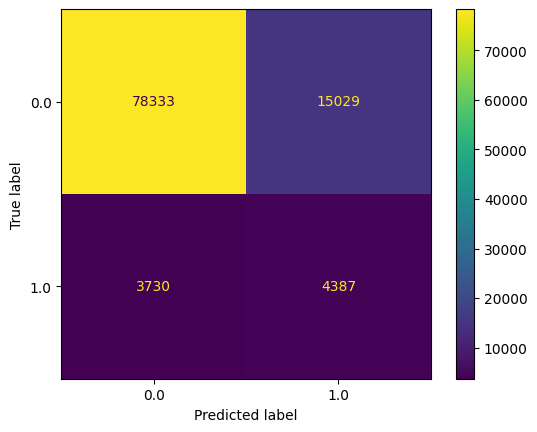

In [16]:
disp = ConfusionMatrixDisplay(
    confusion_matrix=confusion_matrix(y_test, y_predic),
    display_labels=model.classes_
)
disp.plot()
plt.show()

In [17]:
del X_test, y_test, y_predic, y_predic_proba
gc.collect()

8770

In [18]:
del model
gc.collect()

0

# Modélisation par XGBoost

In [19]:
mlflow.xgboost.autolog()
cv = learn_model_cv(frac=1, model="xgb", force_param_opt=False, nb_splits=5)

2023/06/27 06:26:17 WARNING mlflow.utils.autologging_utils: You are using an unsupported version of xgboost. If you encounter errors during autologging, try upgrading / downgrading xgboost to a supported version, or try upgrading MLflow.


Nb of training points: 206032


2023/06/27 06:27:42 WARNING mlflow.utils: Truncated the value of the key `estimator`. Truncated value: `XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='auc', feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.05, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
            ...`


[06:27:50] WARNING: ../src/learner.cc:767: 
Parameters: { "random_seed" } are not used.

[06:34:12] WARNING: ../src/learner.cc:767: 
Parameters: { "random_seed" } are not used.

[06:40:45] WARNING: ../src/learner.cc:767: 
Parameters: { "random_seed" } are not used.

[06:47:21] WARNING: ../src/learner.cc:767: 
Parameters: { "random_seed" } are not used.

[06:53:54] WARNING: ../src/learner.cc:767: 
Parameters: { "random_seed" } are not used.

[07:00:15] WARNING: ../src/learner.cc:767: 
Parameters: { "random_seed" } are not used.



2023/06/27 07:08:51 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/jupyter/.local/lib/python3.8/site-packages/mlflow/sklearn/utils.py:788: UserWarning: Top 5 child runs will be created based on ordering in rank_test_AUC column.  You can choose not to limit the number of child runs created by setting `max_tuning_runs=None`."
2023/06/27 07:08:51 INFO mlflow.sklearn.utils: Logging the 5 best runs, no runs will be omitted.


Trained all the fold in 2556 seconds


In [91]:
X_train= pd.read_parquet(f"../working/train_test_data/1/X_train.parquet")
y_train = np.load(f"../working/train_test_data/1/y_train.npy")
view_roc_cv(1, "xgb", X=X_train, y=y_train)

X.shape=(206032, 512)
y.shape=(206032,)


<img src="mlruns/137357373612153109/2ad9c0a6e47a4d61bf0a6ed746ed9c11/artifacts/training_roc_curve.png">

In [21]:
X_test= pd.read_parquet(f"../working/train_test_data/1/X_test.parquet")
y_test = np.load(f"../working/train_test_data/1/y_test.npy")
view_roc_cv(1, "xgb", X=X_test, y=y_test)

X.shape=(101479, 512)
y.shape=(101479,)


In [22]:
model = joblib.load(f"../working/models/1/xgb/model_cv_best_estimator.joblib")
y_predic_proba = model.predict_proba(X_test.to_numpy())[:, 1]
view_scores_per_threshold(y_test, y_predic_proba)

In [23]:
y_predic = np.where(y_predic_proba>0.49,1,0)
print(classification_report(y_test, y_predic))

              precision    recall  f1-score   support

         0.0       0.96      0.80      0.87     93362
         1.0       0.21      0.59      0.31      8117

    accuracy                           0.79    101479
   macro avg       0.58      0.70      0.59    101479
weighted avg       0.90      0.79      0.83    101479



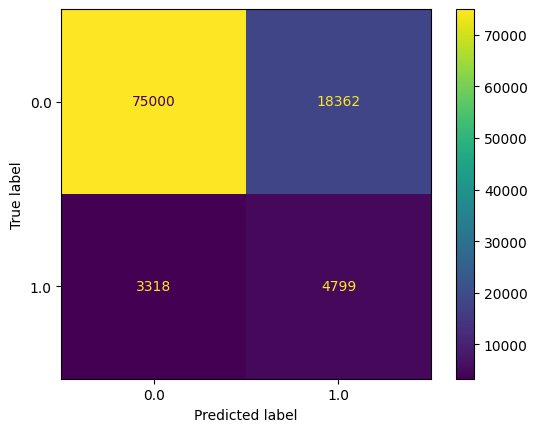

In [24]:
disp = ConfusionMatrixDisplay(
    confusion_matrix=confusion_matrix(y_test, y_predic),
    display_labels=model.classes_
)
disp.plot()
plt.show()

Les 2 modèles ont des ratios qui sont proches. Une analyse métier serait utile pour vois les différences entre les 2 et décider lequel prendre.

En l'état actuel, nous allons nous focaliser sur le fait de minimiser les faux négatifs, nous allons donc garder le modèle avec XGBoostClassifier

# Explication de modèle

In [61]:
model = mlflow.sklearn.load_model('runs:/2ad9c0a6e47a4d61bf0a6ed746ed9c11/xgb_1')

In [62]:
X = pd.read_parquet("../working/df_application_test.parquet")

In [63]:
explainer2 = shap.TreeExplainer(model, max_evals=1000, feature_names=X_train.columns)

<class 'xgboost.sklearn.XGBClassifier'>
True
XGBoostClassifier instance


In [124]:
X_shap2 = np.array(X.iloc[2001:2002].drop(columns="SK_ID_CURR"), dtype=float)


In [125]:
X.iloc[2000:2001]

,SK_ID_CURR,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,...,BUREAU_DAYS_CREDIT_UPDATE_min,BUREAU_DAYS_CREDIT_UPDATE_max,BUREAU_DAYS_CREDIT_UPDATE_mean,BUREAU_DAYS_CREDIT_UPDATE_var,BUREAU_DAYS_CREDIT_UPDATE_sum,BUREAU_MONTHS_BALANCE_min,BUREAU_MONTHS_BALANCE_max,BUREAU_MONTHS_BALANCE_mean,BUREAU_MONTHS_BALANCE_var,BUREAU_MONTHS_BALANCE_sum
2000,114056,4,81000.0,296280.0,16069.5,225000.0,0.008866,-11715,-871,-1589.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [126]:
shap_values2 = explainer(X_shap2)

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


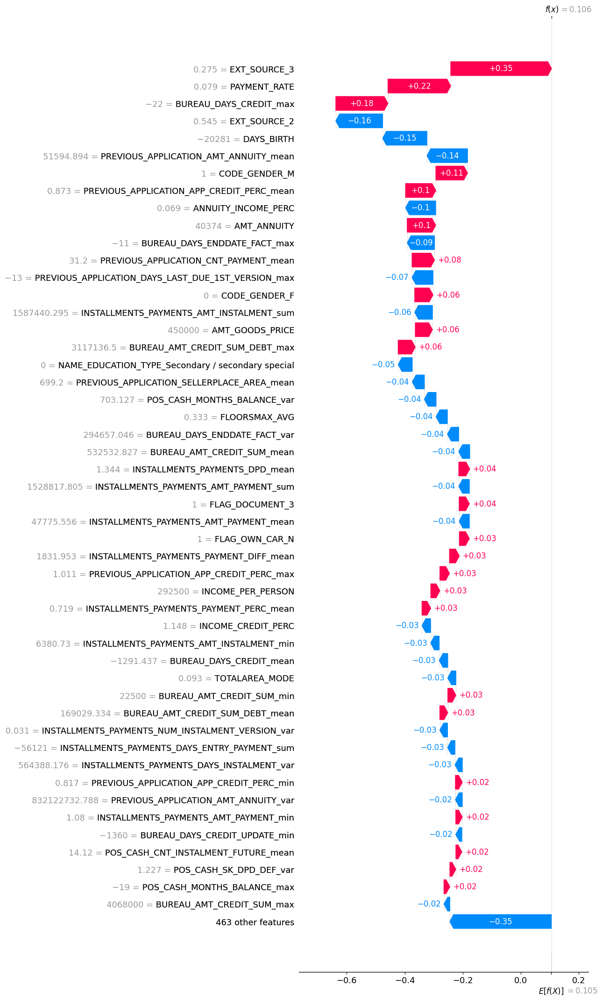

In [127]:
shap.plots.waterfall(shap_values2[0], max_display=50)


Créons une fonction générique:

In [171]:
import io
def get_explanation(sk_id_curr, max_display=50, return_base64=True, show_plot=False):
    ind = X.loc[X["SK_ID_CURR"]==sk_id_curr].index
    if len(ind)==0:
        return {
            "success": False,
            "message": f"SK_ID_CURR {sk_id_curr} non trouvé"
        }

    ind = ind[0]
    X_shap = np.array(X.iloc[ind:ind+1].drop(columns="SK_ID_CURR"), dtype=float)
    shap_values = explainer(X_shap)

    if show_plot:
        shap.plots.waterfall(shap_values[0], max_display=max_display, show=True)
        
    if return_base64:
        pyplot.clf()

        shap.plots.waterfall(shap_values[0], max_display=max_display, show=False)
        pyplot.savefig(f"/tmp/{sk_id_curr}.png", format='png')

        with open(f"/tmp/{sk_id_curr}.png", "rb") as image_file:
            encoded_string = base64.b64encode(image_file.read()).decode('utf-8')
        return {
            "success": True,
            "image": encoded_string
        }


In [172]:
from IPython.core.display import display, HTML

e = get_explanation(456222, return_base64=True, show_plot=False)
#print(e)
display(HTML(f'<img src="data:image/png;base64, {e["image"]}">'))

Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
ntree_limit is deprecated, use `iteration_range` or model slicing instead.


# Récupération du modèle pour utilisation future

Nous avons utilisé MLFlow pour tracker les différentes expérimentations. 

Pour créer notre API, nous allons utiliser le modèle XGB enregistré dans MLFlow

<img src="mlflow_1.jpg">

On trouve facilement le chemin complet du modèle enregistré:
```
file:///home/jupyter/notebooks/modeling/mlruns/137357373612153109/2ad9c0a6e47a4d61bf0a6ed746ed9c11/artifacts/xgb_1/MLmodel
```


Nous allons copier ce dossier dans le dossier destiné à notre API